14536120/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
648128/648128 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


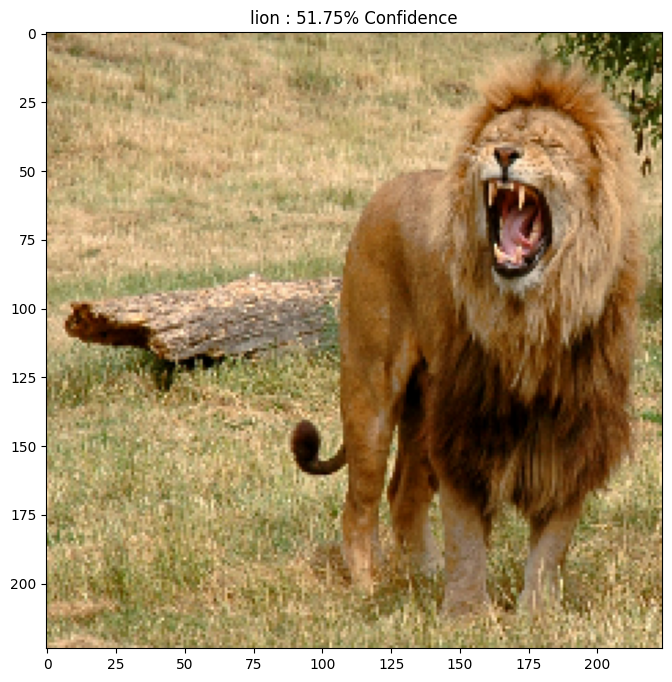

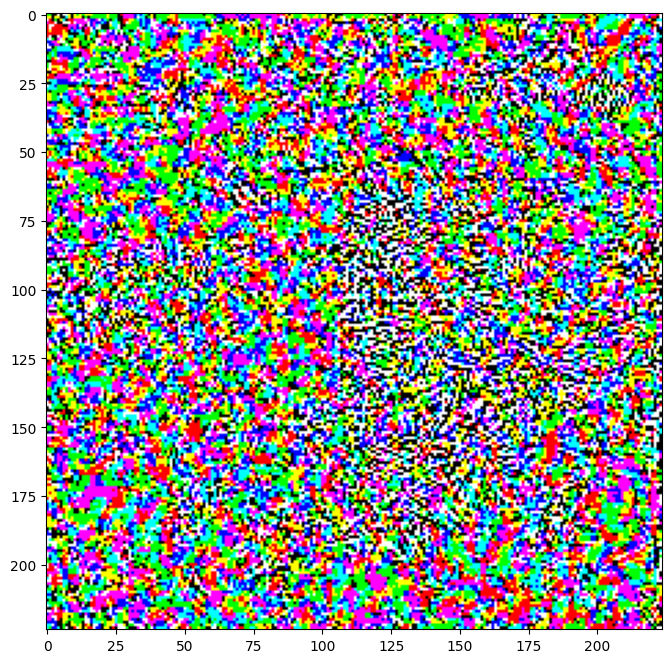

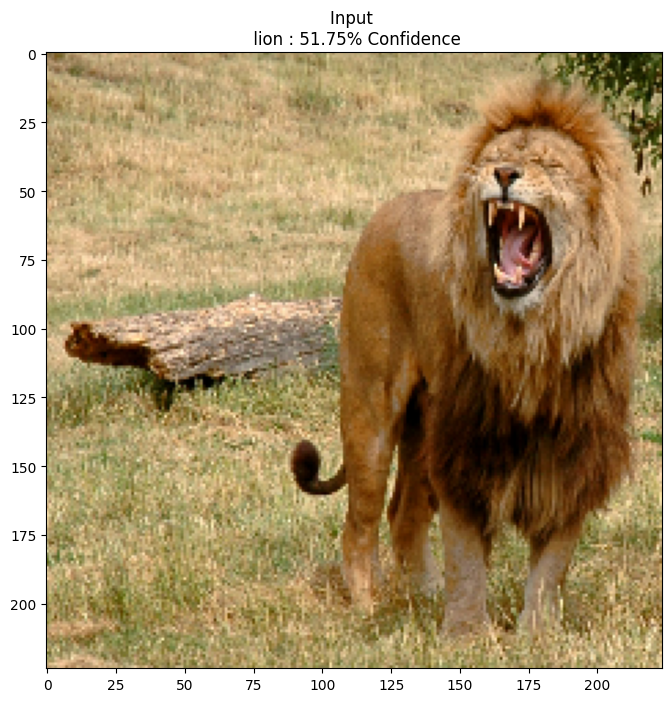

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


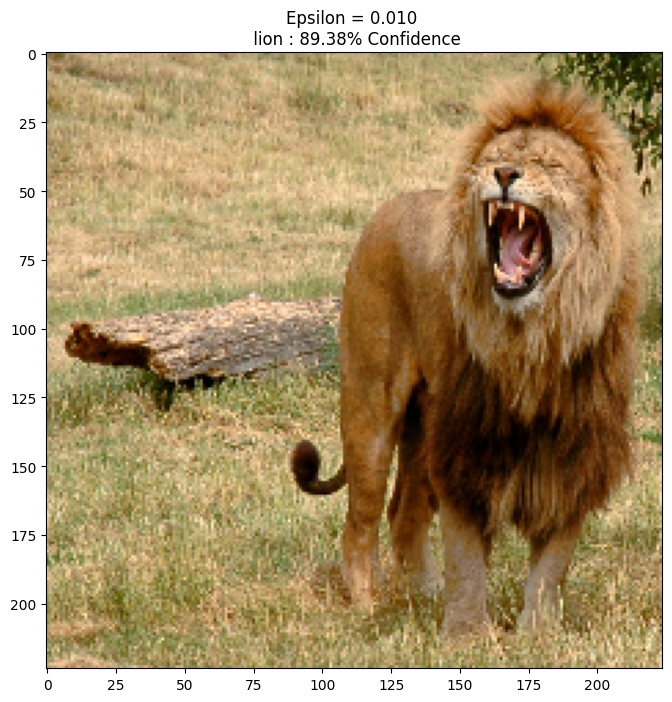

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


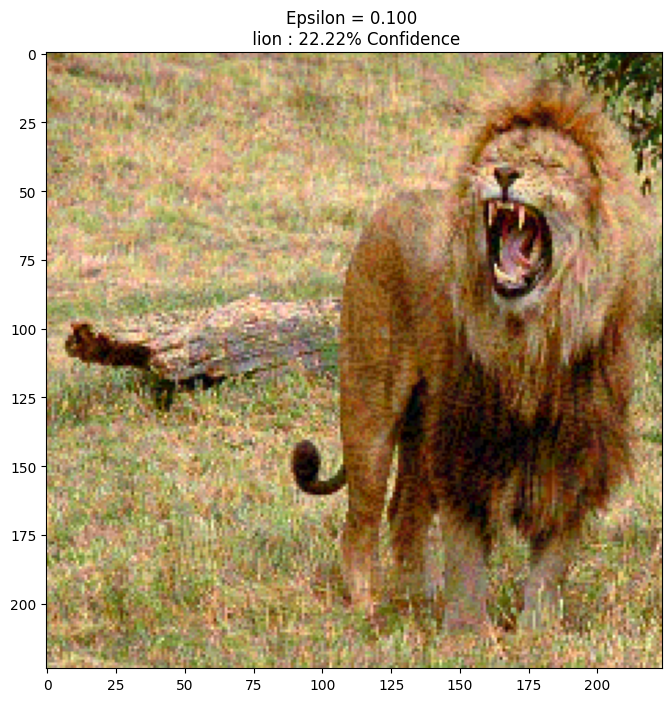

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


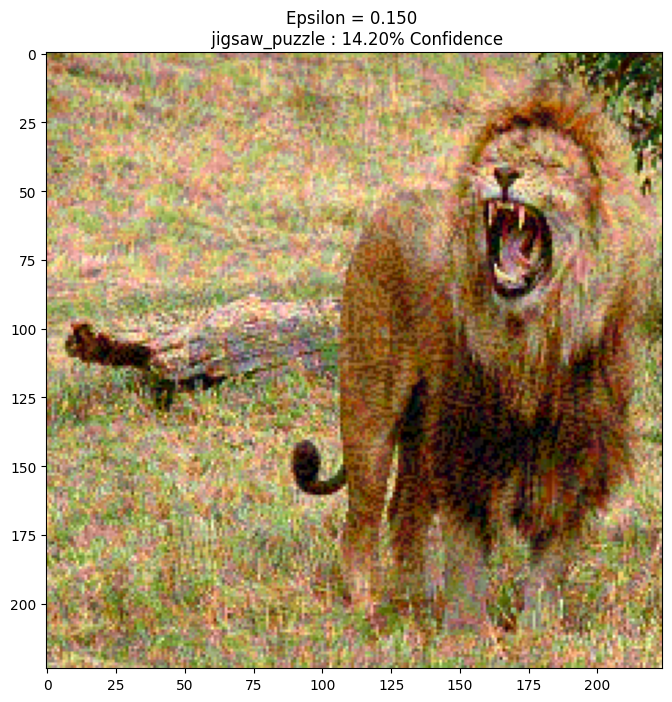

In [1]:
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

pretrained_model = tf.keras.applications.MobileNetV2(include_top=True, weights='imagenet')
pretrained_model.trainable = False

decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

def preprocess(image):
  image = tf.cast(image,tf.float32)
  image = tf.image.resize(image,(224,224))
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  image = image[None, ...]
  return image

def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]

#image_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://upload.wikimedia.org/wikipedia/commons/a/a3/Black_cat_portraits.jpg')
image_path = tf.keras.utils.get_file('Just_one_lion.jpg', 'https://upload.wikimedia.org/wikipedia/commons/4/40/Just_one_lion.jpg')
#image_path = tf.keras.utils.get_file('Black_cat.JPG', 'https://upload.wikimedia.org/wikipedia/commons/1/10/Black_cat.JPG')

image_raw = tf.io.read_file(image_path)
image = tf.image.decode_image(image_raw)

image = preprocess(image)
image_probs = pretrained_model.predict(image)

plt.figure()
plt.imshow(image[0] * 0.5 + 0.5)
_, image_class, class_confidence = get_imagenet_label(image_probs)
plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))

loss_object = tf.keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = pretrained_model(input_image)
    loss = loss_object(input_label, prediction)

  gradient = tape.gradient(loss, input_image)
  signed_grad = tf.sign(gradient)
  return signed_grad

labrador_retriever_index = 208
label = tf.one_hot(labrador_retriever_index, image_probs.shape[-1])
label = tf.reshape(label, (1,image_probs.shape[-1]))

perturbations = create_adversarial_pattern(image, label)
plt.figure()
plt.imshow(perturbations[0] * 0.5 + 0.5)

def display_images(image, description):
  _, label, confidence = get_imagenet_label(pretrained_model.predict(image))
  plt.figure()
  plt.imshow(image[0] * 0.5 + 0.5)
  plt.title('{} \n {} : {:.2f}% Confidence'.format(description, label, confidence*100))
  plt.show()

epsilons = [0, 0.01, 0.1, 0.15]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input') for eps in epsilons]

for i, eps in enumerate(epsilons):
  adv_x = image + eps*perturbations
  adv_x = tf.clip_by_value(adv_x, -1, 1)
  display_images(adv_x,descriptions[i])




1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


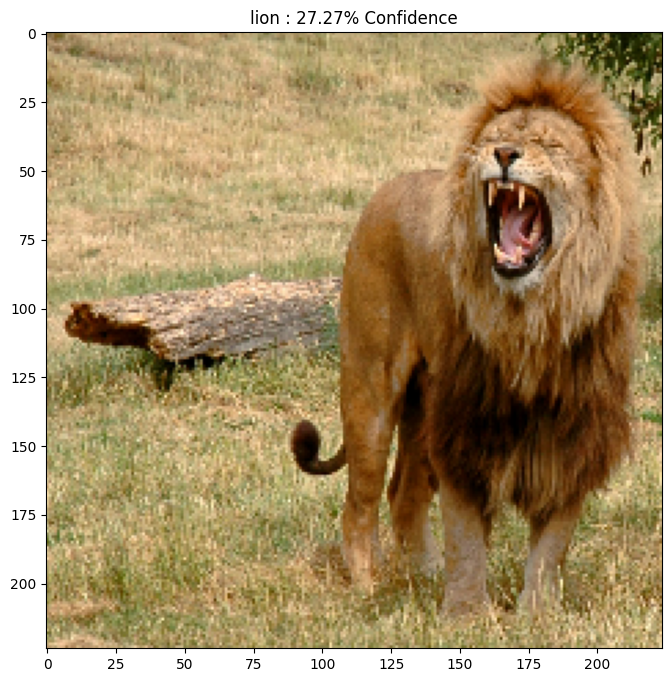

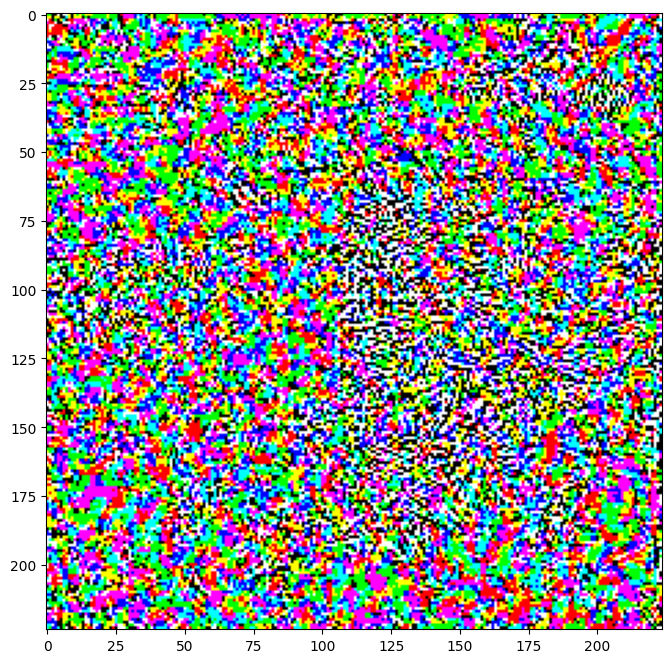

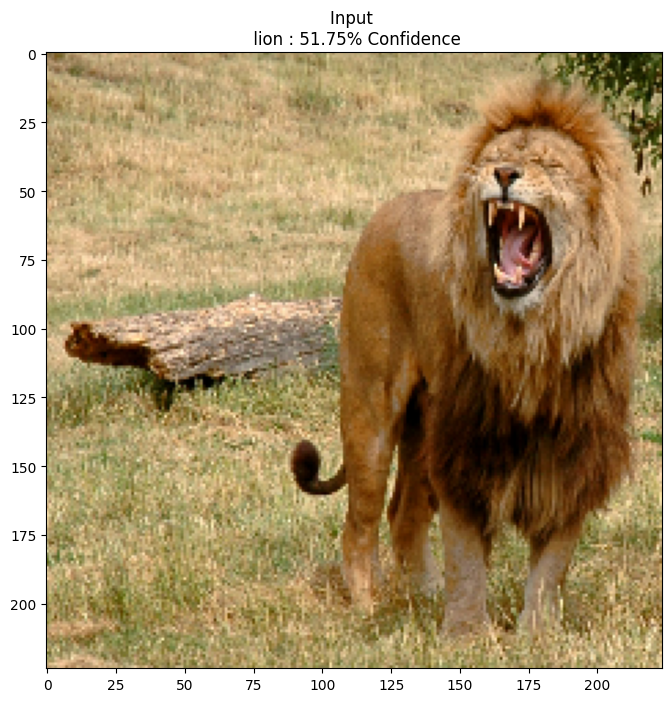

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


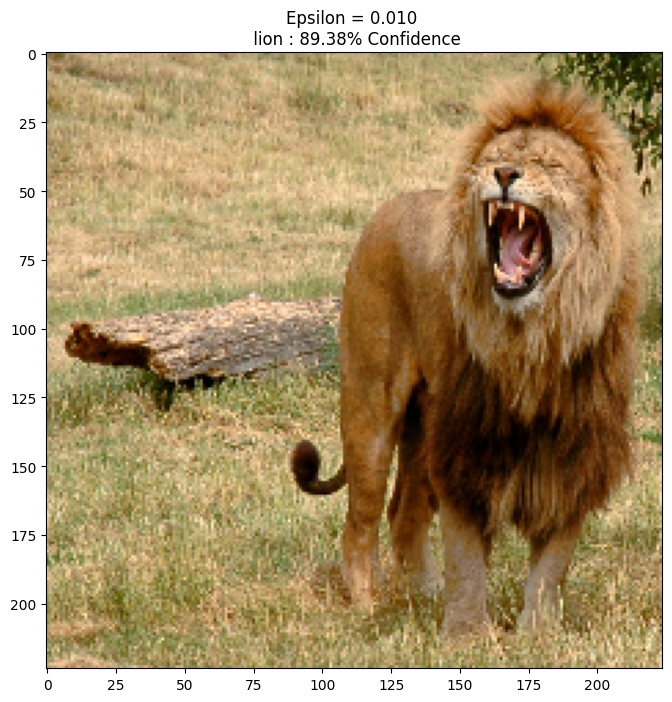

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


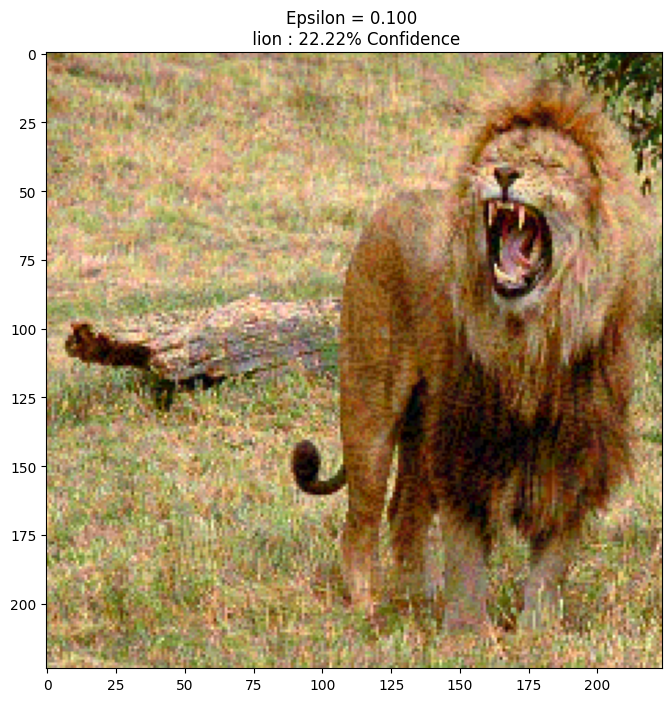

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


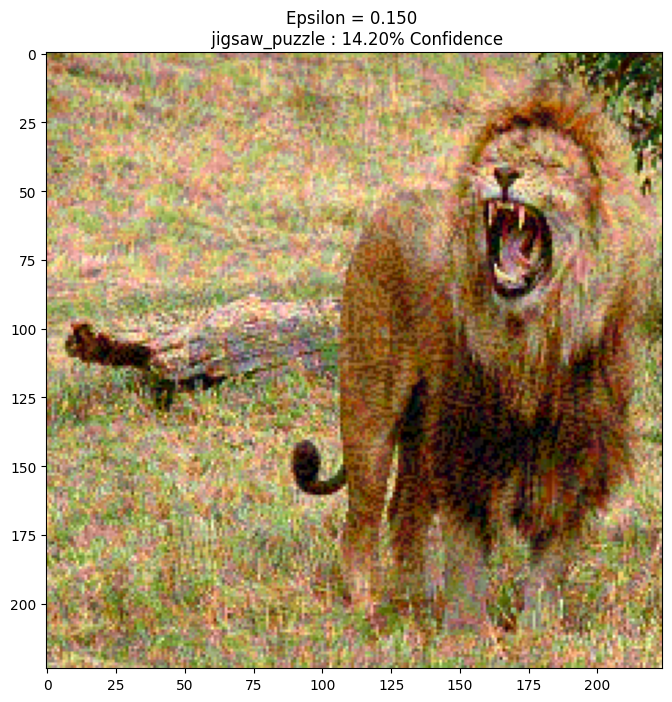

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


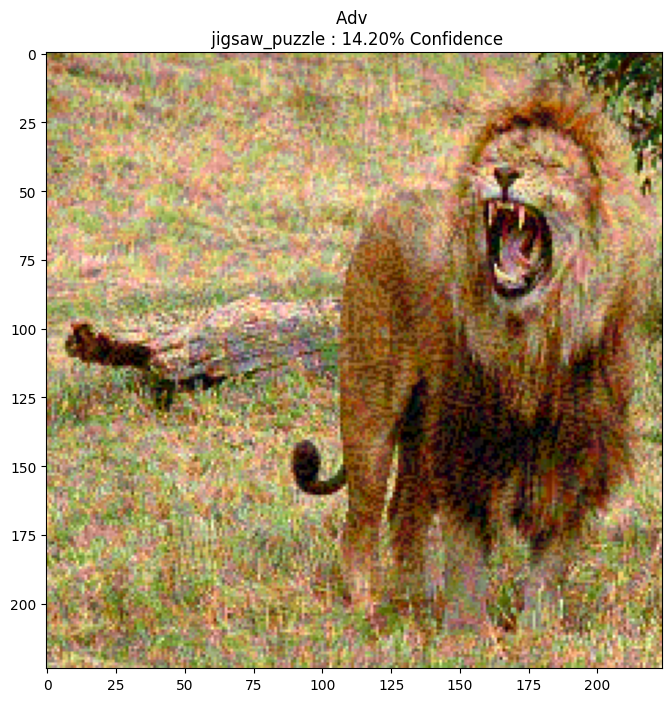


Epoch 1/5


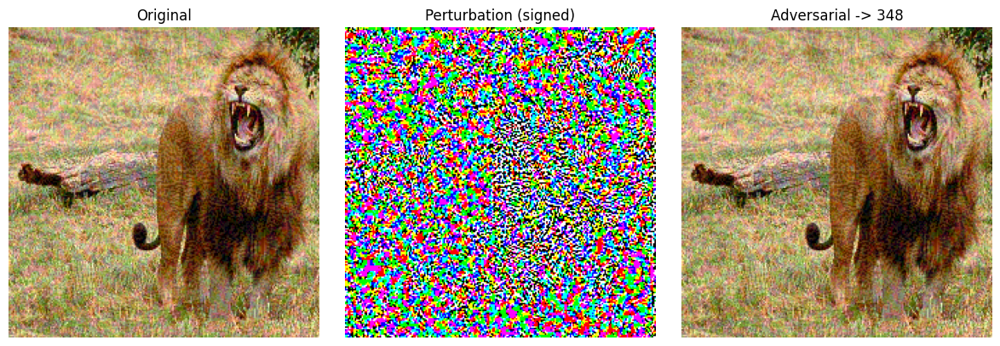

Epoch 1 complete. Total loss: 13.9954

Epoch 2/5


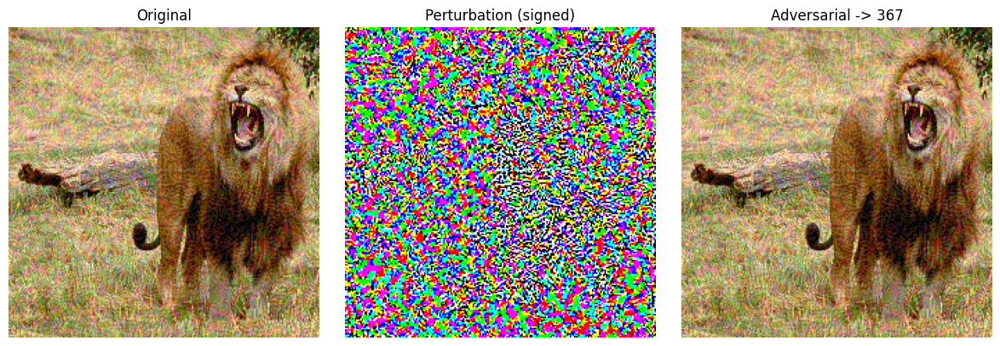

Epoch 2 complete. Total loss: 9.2806

Epoch 3/5


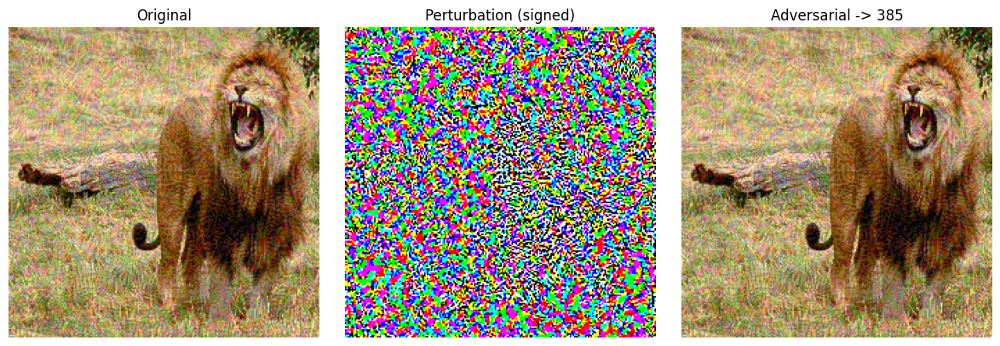

Epoch 3 complete. Total loss: 2.7449

Epoch 4/5


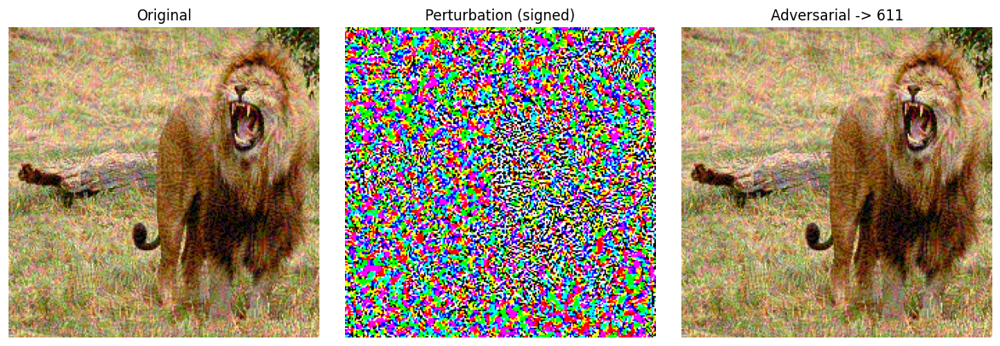

Epoch 4 complete. Total loss: 0.0900

Epoch 5/5


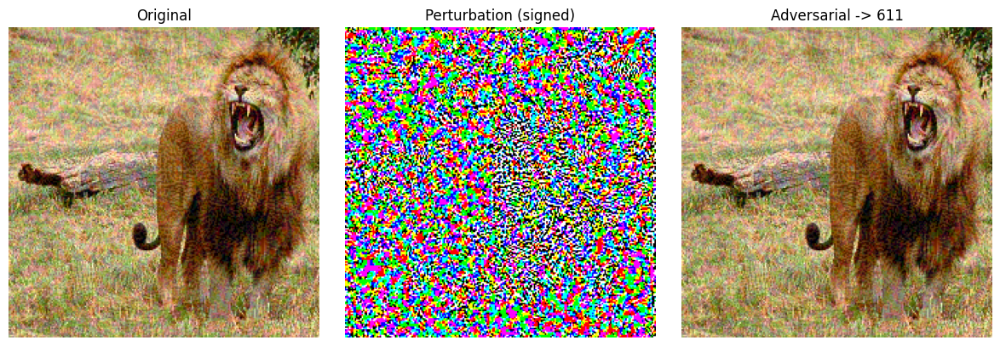

Epoch 5 complete. Total loss: 0.0205


In [3]:
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False


def gaussian_blur_tf(image, kernel_size=3, sigma=1.0):
  def gaussian_kernel(size, sigma):
    x = tf.range(-size // 2 + 1, size // 2 + 1, dtype=tf.float32)
    x = tf.math.exp(-0.5 * tf.square(x) / tf.square(sigma))
    kernel_1d = x / tf.reduce_sum(x)
    kernel_2d = tf.tensordot(kernel_1d, kernel_1d, axes=0)
    return kernel_2d[:,:, tf.newaxis, tf.newaxis]

  kernel = gaussian_kernel(kernel_size,sigma)
  kernel = tf.tile(kernel, [1,1,3,1])

  blurred = tf.nn.depthwise_conv2d(image, kernel, strides=[1,1,1,1], padding='SAME')
  return blurred


pretrained_model = tf.keras.applications.MobileNetV2(include_top=True, weights='imagenet')
pretrained_model.trainable = True

decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

def preprocess(image):
  image = tf.cast(image,tf.float32)
  image = tf.image.resize(image,(224,224))
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  image = image[None, ...]
  return image

def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]

#image_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://upload.wikimedia.org/wikipedia/commons/a/a3/Black_cat_portraits.jpg')
image_path = tf.keras.utils.get_file('Just_one_lion.jpg', 'https://upload.wikimedia.org/wikipedia/commons/4/40/Just_one_lion.jpg')
#image_path = tf.keras.utils.get_file('Black_cat.JPG', 'https://upload.wikimedia.org/wikipedia/commons/1/10/Black_cat.JPG')

image_raw = tf.io.read_file(image_path)
image = tf.image.decode_image(image_raw)

image = preprocess(image)
blurred_image = gaussian_blur_tf(image)
image_probs = pretrained_model.predict(blurred_image)

plt.figure()
plt.imshow(image[0] * 0.5 + 0.5)
_, image_class, class_confidence = get_imagenet_label(image_probs)
plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))

loss_object = tf.keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = pretrained_model(input_image)
    loss = loss_object(input_label, prediction)

  gradient = tape.gradient(loss, input_image)
  signed_grad = tf.sign(gradient)
  return signed_grad

black_cat_index = 208
label = tf.one_hot(labrador_retriever_index, image_probs.shape[-1])
label = tf.reshape(label, (1,image_probs.shape[-1]))

perturbations = create_adversarial_pattern(image, label)
plt.figure()
plt.imshow(perturbations[0] * 0.5 + 0.5)

def display_images(image, description):
  _, label, confidence = get_imagenet_label(pretrained_model.predict(image))
  plt.figure()
  plt.imshow(image[0] * 0.5 + 0.5)
  plt.title('{} \n {} : {:.2f}% Confidence'.format(description, label, confidence*100))
  plt.show()

epsilons = [0, 0.01, 0.1, 0.15]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input') for eps in epsilons]

for i, eps in enumerate(epsilons):
  adv_x = image + eps*perturbations
  adv_x = tf.clip_by_value(adv_x, -1, 1)
  display_images(adv_x,descriptions[i])


def display_adversarial_effect(original, perturbation, adversarial, label, adv_pred_label):
  fig, axes = plt.subplots(1, 3, figsize =(12,4))

  orig = original.numpy().squeeze()
  pert = perturbation.numpy().squeeze()
  adv = adversarial.numpy().squeeze()

  axes[0].imshow((orig * 0.5 + 0.5))
  axes[0].set_title("Original")
  axes[0].axis('off')

  axes[1].imshow((perturbations[0] * 0.5 + 0.5))
  axes[1].set_title("Perturbation (signed)")
  axes[1].axis('off')

  axes[2].imshow((adv * 0.5 + 0.5))
  axes[2].set_title(f"Adversarial -> {adv_pred_label}")
  axes[2].axis('off')

  plt.tight_layout()
  plt.show()

def train_with_adversarial_defense(model, image, label, epochs=5, epsilon=0.01):
  model_trainable = True

  optimizer = tf.keras.optimizers.Adam()
  loss_fn = tf.keras.losses.CategoricalCrossentropy()

  for epoch in range(epochs):
      print(f"\nEpoch {epoch + 1}/{epochs}")

      with tf.GradientTape() as tape:
        predictions = model(image, training=True)
        clean_loss = loss_fn(label, predictions)

        perturbations = create_adversarial_pattern(image, label)
        adv_images = image + epsilon * perturbations
        adv_images = tf.clip_by_value(adv_images, -1, 1)

        adv_predictions = model(adv_images, training=True)
        adv_loss = loss_fn(label, adv_predictions)

        total_loss = clean_loss + adv_loss

      gradients = tape.gradient(total_loss, model.trainable_variables)
      optimizer.apply_gradients(zip(gradients, model.trainable_variables))

      sample_pert = epsilon * perturbations
      sample_adv = adv_images
      pred_label = tf.argmax(model(sample_adv), axis=-1)[0]
      display_adversarial_effect(image, sample_pert, sample_adv, label, pred_label)

      print(f"Epoch {epoch + 1} complete. Total loss: {total_loss.numpy():.4f}")

adv_x = image + 0.15*perturbations
adv_x = tf.clip_by_value(adv_x, -1, 1)
display_images(adv_x,"Adv")

black_cat_index = 208
label = tf.one_hot(black_cat_index, image_probs.shape[-1])
label = tf.reshape(label, (1, image_probs.shape[-1]))
train_with_adversarial_defense(pretrained_model, adv_x, label)




Number of poisoned samples: 20000
training on clean data ...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
704/704 - 19s - 27ms/step - accuracy: 0.3788 - loss: 1.7412 - val_accuracy: 0.3658 - val_loss: 1.7701
Epoch 2/20
704/704 - 22s - 31ms/step - accuracy: 0.4398 - loss: 1.5783 - val_accuracy: 0.4624 - val_loss: 1.5316
Epoch 3/20
704/704 - 17s - 25ms/step - accuracy: 0.4597 - loss: 1.5387 - val_accuracy: 0.4854 - val_loss: 1.4679
Epoch 4/20
704/704 - 18s - 25ms/step - accuracy: 0.4841 - loss: 1.4777 - val_accuracy: 0.4864 - val_loss: 1.4591
Epoch 5/20
704/704 - 19s - 27ms/step - accuracy: 0.5016 - loss: 1.4281 - val_accuracy: 0.4498 - val_loss: 1.5488
Epoch 6/20
704/704 - 18s - 25ms/step - accuracy: 0.5057 - loss: 1.4220 - val_accuracy: 0.4580 - val_loss: 1.5758
Epoch 7/20
704/704 - 22s - 31ms/step - accuracy: 0.5102 - loss: 1.4080 - val_accuracy: 0.5094 - val_loss: 1.4552
Epoch 8/20
704/704 - 18s - 25ms/step - accuracy: 0.5171 - loss: 1.3917 - val_accuracy: 0.5070 - val_loss: 1.4185
Epoch 9/20
704/704 - 19s - 27ms/step - accuracy: 0.5214 - loss: 1.3780 - val_accuracy: 0.4970 - 

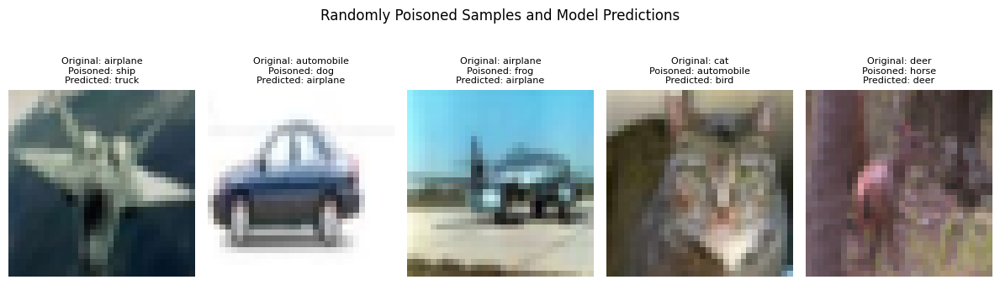

In [10]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# 1. Load CIFAR-10 Dataset
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()
x_train = x_train.astype("float32")/255.0
x_test = x_test.astype("float32") / 255.0
y_train = y_train.flatten()
y_test = y_test.flatten()

#class names for CIFAR - 10
class_names = ['airplane','automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

def poison_random_labels_with_indices(x,y,fraction =0):
  num_poison=int(fraction*len(y))
  idxs = np.random.choice(len(y), size = num_poison, replace = False)
  y_poisoned = y.copy()
  original_labels=y[idxs]
  y_poisoned[idxs] = np.random.randint(0,10,size=num_poison)
  return x, y_poisoned, idxs, original_labels

#use this version
x_poisoned, y_poisoned,poisoned_idx,original_labels = poison_random_labels_with_indices(x_train,y_train,fraction = 0.4)

print(f"Number of poisoned samples: {len(poisoned_idx)}")

def build_weak_model():
  model = tf.keras.Sequential([
      tf.keras.layers.Conv2D(16,3,activation='relu', input_shape=(32,32,3)),
      tf.keras.layers.MaxPooling2D(),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(10)
  ])
  optimizer = tf.keras.optimizers.Adam(learning_rate = 0.01)
  model.compile(optimizer,
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits =True),
                metrics = ['accuracy'])
  return model

clean_model = build_weak_model()
poisoned_model = build_weak_model()

print("training on clean data ...")
clean_model.fit(x_train,y_train, epochs = 20, batch_size=64, validation_split=0.1, verbose=2)

print("\nTraining on poisoned data ...")
poisoned_model.fit(x_poisoned,y_poisoned,epochs=20,batch_size=64,validation_split=0.1,verbose=2)

# Evaluate on clean test data
clean_loss, clean_acc = clean_model.evaluate(x_test, y_test, verbose=0)
poisoned_loss, poisoned_acc = poisoned_model.evaluate(x_test, y_test, verbose=0)

print(f"\nClean Model Accuracy: {clean_acc*100:.2f}%")
print(f"Poisoned Model Accuracy: {poisoned_acc*100:.2f}%")

from sklearn.metrics import classification_report

# Get predictions
clean_preds = np.argmax(clean_model.predict(x_test), axis=1)
poisoned_preds = np.argmax(poisoned_model.predict(x_test), axis=1)

# Full accuracy (recomputed)
clean_acc = np.mean(clean_preds == y_test)
poisoned_acc = np.mean(poisoned_preds == y_test)

print(f"\nClean Model Accuracy: {clean_acc*100:.2f}%")
print(f"Poisoned Model Accuracy: {poisoned_acc*100:.2f}%")

# Class-wise comparison
print("Clean Model Classification Report:")
print(classification_report(y_test, clean_preds, target_names=class_names))

print("\nPoisoned Model Classification Report:")
print(classification_report(y_test, poisoned_preds, target_names=class_names))

# Use your trained poisoned model to predict
logits = poisoned_model.predict(x_poisoned[poisoned_idx[:5]])
preds = np.argmax(logits, axis=1)

# Plot
plt.figure(figsize=(12, 4))
for i, idx in enumerate(poisoned_idx[:5]):
    plt.subplot(1, 5, i+1)
    plt.imshow(x_poisoned[idx])
    was_label  = class_names[original_labels[i]]
    now_label  = class_names[y_poisoned[idx]]
    pred_label = class_names[preds[i]]
    plt.title(
        f"Original: {was_label}\n"
        f"Poisoned: {now_label}\n"
        f"Predicted: {pred_label}",
        fontsize=8
    )
    plt.axis('off')
plt.suptitle("Randomly Poisoned Samples and Model Predictions")
plt.tight_layout()
plt.show()
